# Проектная работа. Рынок заведений общественного питания Москвы

**Описание**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.


Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.


Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Введение

Необходимо проанализировать рынок общепита Москвы, сделать выводы и дать рекомендации по открытию кофейни инвесторам.

Для этого загружу, обработаю и изучу данные о рынке общепита.

Посмотрю распределение категорий кафе, рейтингов, регионов и тд.

На основе анализа сделаю выводы и сформулирую рекомендации

## Загрузка и предобработка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import plotly.graph_objects as go
import plotly.express as px
from folium import Map, Choropleth, Marker
# импортируем кластер
from folium.plugins import MarkerCluster
data = pd.read_csv('/datasets/moscow_places.csv')
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Выводы**

- Всего в таблице 14 столбцов с информацией. Количество строк в необработанных данных 8406.
- у большинства заведений указаны часы работы. 
- менее чем у половины (3315) заведений не указано средней стоимости заказа 
- у 4795 заведений указано количество посадочных мест.

Значения широты, долготы, рейтинга, средних чеков, средних цен на кофе, кол-во посадочных мест в заведении имеют числовой формат, что является логичным. 



**Проверю данные на дубликаты строк, чтобы ответить, сколько в действительности данных имеется**

In [3]:
# приведу столбца с адресом и названием места к нижнему регистру, чтобы избежать ошибок в написании
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
# в сочетании с названием места и адресом проверю дубликаты
data.duplicated(subset=['name', 'address']).sum()
print(len(data))
data = data.drop_duplicates(subset=['name', 'address'])
print(len(data))

8406
8402


In [5]:
print('Было удалено 4 неявных дубликата')

Было удалено 4 неявных дубликата


In [6]:
print('Количество представленных уникальных заведений {}'.format(data['name'].nunique()))

Количество представленных уникальных заведений 5512


**вывод**

Таким образом, в данных обнаружено 4 дубликата 

Количество уникальных заведений 5512, хотя в данных более 8000 строк. Это говорит о том, что много заведений являются сетью ресторанов/кафе/кофеен. 

Название одно, адреса разные.

тип данных соответсвует значениям.

есть наличие пропусков в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.



**Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?
Выполните предобработку данных:
Создайте столбец street с названиями улиц из столбца с адресом.
Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.**/

### Дубликаты

были проверены в предыдущем шаге

### Пропуски в данных

Из общей информации о датасете можно сказать в каких столбцах есть пропуски:
- hours
- price
- avg_bill
- middle_avg_bill
- middle_coffee_cup
- seats        


### `hours` и `price`

Часы работы заведения лучше не менять, иначе можно ввести в заблуждение.

Аналогично с ценовым сегментом. 

Лучше проверить данные по среднему чеку, и заменить пропуски.

### `avg_bill` и `middle_avg_bill`

In [7]:
new_avg_bill = data.groupby('avg_bill')['middle_avg_bill'].max().dropna()
# в данной переменной будет хранится значение для каждой группы среднего чека. 

In [8]:
new_avg_bill.head()

avg_bill
Средний счёт:100 ₽            100.0
Средний счёт:1000 ₽          1000.0
Средний счёт:1000–10000 ₽    5500.0
Средний счёт:1000–1100 ₽     1050.0
Средний счёт:1000–1200 ₽     1100.0
Name: middle_avg_bill, dtype: float64

In [9]:
# имея данные категория - значение среднего чека - можно заменить пропуски в данных.
def func_avg(avg_bill):
    if avg_bill in new_avg_bill:
        return new_avg_bill[avg_bill]

In [10]:
# заменяю пропуски
data.loc[data['middle_avg_bill'].isna(), 'middle_avg_bill'] = data['avg_bill'].apply(func_avg)


Еще есть пропущенные значения в столбце с чеком кофе. В конце работы я сделаю два варианта анализа, чтобы понять, как правильно - заменять или нет

**Вывод:**
Из за того, что разные категории заведений - в данных могли появиться пропуски. 

Пропуски в среднем чеке и средней цене на кофе вызваны тем, что данные из столбца avg_bill распределяются по разным столбцам. ПОэтому наличие пропусков не ошибка

ОСтальные пропуски не буду заполнять. Также в мелких сетях, по условию, могут быть ошибки.

### `seats`


In [11]:
data['seats'].describe()


count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

ПОдозрительно большое количество мест - 1288, тогда как 75% заведений имеют до 140 мест.

По разным заведениям можно посмотреть как распределены места. 

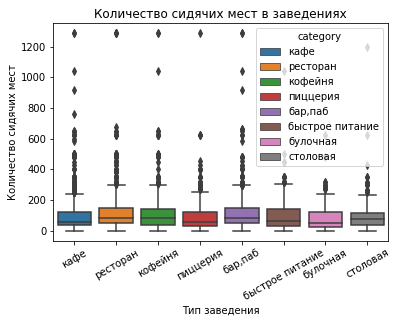

In [12]:
ax = sb.boxplot(y='seats', x='category', data=data, hue="category", dodge=False)
sb.set(rc={'figure.figsize':(13,13)})
plt.title('Количество сидячих мест в заведениях')
plt.xlabel('Тип заведения')
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
plt.ylabel('Количество сидячих мест')
plt.show()

Видно, что в данных много выбросов. Необходимо ограничить количество мест в заведении для исследования

В целом у многих заведений количество мест может доходить до 550. Это число будет границей.

In [13]:
print('Количество заведений с числом мест больше 550:', data[data['seats'] > 550]['name'].count())
print('Процент заведений с числом мест более 550: {0:.2%}'.format(data[data['seats'] > 550]['name'].count()/data['name'].nunique()))

Количество заведений с числом мест больше 550: 56
Процент заведений с числом мест более 550: 1.02%


Один процент не повляет на результаты исследования, поэтому можно удалить эти заведения.


In [14]:
place_550 = data[data['seats'] > 550] #заведения с более 550 местами
data = data.query('index not in @place_550.index')
print('Заведений с числом мест больше 550:', data[data['seats'] > 550]['name'].count())

Заведений с числом мест больше 550: 0


**Выполните предобработку данных:**

Создайте столбец street с названиями улиц из столбца с адресом.

Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

    - логическое значение True — если заведение работает ежедневно и круглосуточно;
    - логическое значение False — в противоположном случае

In [15]:
# город и улица разделены ", ". При разбивке ячейки получается список из 3х элементов (город, улица, номер дома)
# чтобы достать улицу, нужно выбрать 1 элемент списка
data['street'] = data['address'].str.split(', ').str[1]

In [16]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False


## Анализ данных

Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [17]:
category_name = data.groupby('category', as_index= False)['name'].count()
category_name.columns = ['category', 'count']
category_name

,category,count
0,"бар,паб",754
1,булочная,255
2,быстрое питание,602
3,кафе,2362
4,кофейня,1401
5,пиццерия,629
6,ресторан,2030
7,столовая,313


Построю круговую диграмму, чтобы наглядно показать распределение

In [18]:
go.Figure(data=[go.Pie(labels=category_name['category'], values= category_name['count'])], layout = go.Layout(title=go.layout.Title(text='Круговая диаграмма категорий заведений')))


In [19]:
fig = px.bar(category_name.sort_values(by='count', ascending=False),
             x='category',
             y='count',
             text= 'count',
             height=500,
             width=700
             )
fig.update_layout(title = 'Количество заведений по категориям',
                  xaxis_title = 'Категория заведения',
                  yaxis_title = 'Количество заведениq')
fig.show()

**Вывод**

в данных кафе лидируют (2362 шт).
Рестораны занимают второе место (2030)

Булочных насчитывает всего 255 шт

52% составляют кафе и рестороны.

Кафе и рестораны составляют больше половины от всех заведений. Кофейни, бары/пабы и пиццерии составляют 32% всех заведений.

остальные доли приходятся на фаст фуд, столовые, булочные.

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.**

In [20]:
# так как категорий заведений много, то сделаю описательную таблицу для исследования
category_describe = data.groupby('category')['seats'].describe().round(2).reset_index()
category_describe

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",457.0,108.95,93.28,0.0,47.00,80.0,140.00,480.0
1,булочная,147.0,85.74,87.35,0.0,25.00,50.0,120.00,478.0
2,быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
3,кафе,1203.0,89.42,88.81,0.0,35.00,60.0,105.50,500.0
4,кофейня,739.0,100.43,90.99,0.0,40.00,78.0,140.00,500.0
5,пиццерия,423.0,87.91,85.48,0.0,30.00,52.0,120.00,455.0
6,ресторан,1257.0,114.90,96.96,0.0,48.00,86.0,150.00,500.0
7,столовая,162.0,89.72,77.27,0.0,40.00,75.0,115.00,428.0


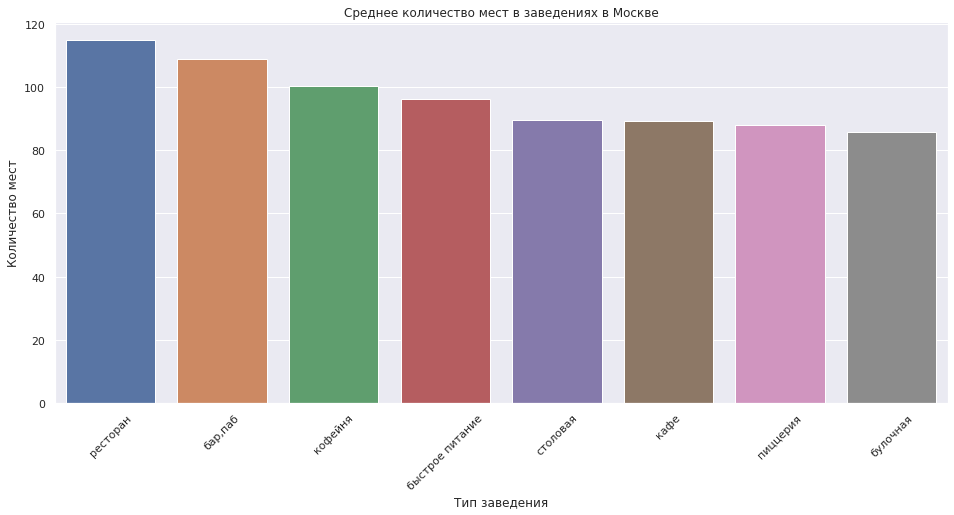

In [21]:
# построю гистограмму по среднему, медианному количеству мест в заведениях
f, ax = plt.subplots(figsize=(16, 7))

ax = sb.barplot(data = category_describe.sort_values(by = 'mean', ascending = False), x = 'category', y = 'mean')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Среднее количество мест в заведениях в Москве')
plt.xticks(rotation=45)
plt.show()

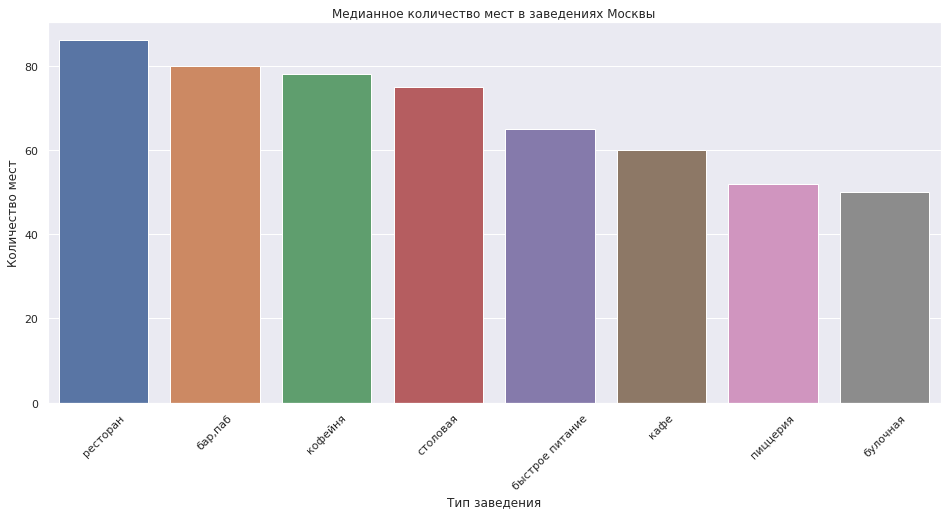

In [22]:
f, ax = plt.subplots(figsize=(16, 7))

ax = sb.barplot(data = category_describe.sort_values(by = '50%', ascending = False), x = 'category', y = '50%')
ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество мест')
ax.set_title('Медианное количество мест в заведениях Москвы')
plt.xticks(rotation=45)
plt.show()

In [23]:
order = data.groupby(["category"])["seats"].median().sort_values(ascending=False).index


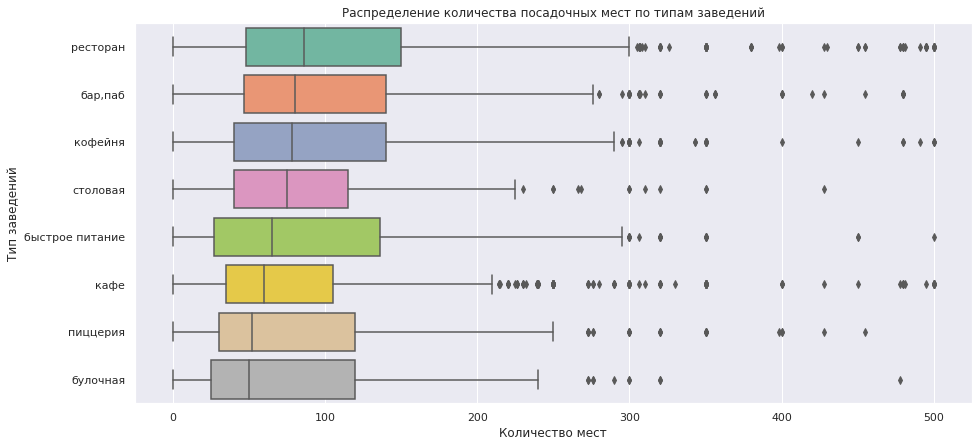

In [24]:
plt.figure(figsize=(15, 7))
ax = sb.boxplot(data=data, x='seats', y='category', palette="Set2", order = order)
plt.title('Распределение количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.show()

**Вывод:** 

Рестораны, пабы/бары и кофейни занимают лидирующие места по количеству мест. 

за ними следуют столовые и заведения быстрого питания. Кафе, пиццерии и булочные меньше всего обладают посадочными местами.



**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [25]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5169
1,1,3177


In [26]:
# так как данных не много, то можно посмотроить круговую диаграмму, чтобы увидеть распределение

fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

**Вывод:** 
    
В Москве большая счасть заведение  - несетевые



**Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.**

In [27]:
category_chain = data.groupby(['category', 'chain'], as_index = False)['name'].count()
category_chain.columns = ['category', 'chain', 'count']
category_chain['chain'] = category_chain['chain'].astype(object)
category_chain = category_chain.sort_values(['count', 'chain'])
category_chain

,category,chain,count
15,столовая,1,87
2,булочная,0,99
3,булочная,1,156
1,"бар,паб",1,167
14,столовая,0,226
5,быстрое питание,1,231
10,пиццерия,0,301
11,пиццерия,1,328
4,быстрое питание,0,371
0,"бар,паб",0,587


In [28]:
fig = px.bar(category_chain,
             x='count',
             y='category',
             text= 'count',
             color='chain',
             category_orders={"chain":['сетевой', 'несетевой']},
             height=500,
             width=700
             )
fig.update_layout(title = 'Соотношение сетевых и несетевых заведений',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Категории')
fig.show()

**Выводы:**

из графика видно, что в целом во всех категориях преобладает несетевой тип заведения.

Но в кофейне, пиццерии и булочной количество сетевых заведений больше (особенно у последних) 

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

In [29]:
chain_points = data[data['chain'] == 1]
top_15 = chain_points.groupby('name').agg({'rating': 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15 = top_15.rename(columns={'district':'count'})
top_15 = top_15.sort_values('count', ascending = False).reset_index().head(15)
top_15

,name,rating,category,count
0,шоколадница,4.20,кофейня,118
1,домино'с пицца,4.20,пиццерия,76
2,додо пицца,4.30,пиццерия,74
3,one price coffee,4.20,кофейня,70
4,яндекс лавка,4.00,ресторан,68
5,cofix,4.10,кофейня,65
6,prime,4.20,ресторан,50
7,хинкальная,4.40,кафе,44
8,кофепорт,4.20,кофейня,42
9,теремок,4.10,ресторан,38


In [30]:
fig = px.bar(top_15,
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Топ-15 популярных сетей Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()

In [31]:
fig = px.bar(top_15,
             x='count', 
             y='category',
             color='category',
             text = 'name'
            )

fig.update_layout(title='Количество заведений по категориям из топ-15 популярных сетей Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                   yaxis={'categoryorder':'total ascending'},
                   width=900,
                   height=500
                 )
fig.show()

**Вывод**

самая популярная сеть - шоколадница. За ней идет доминос пицца и додо. (пиццерии)

Точек Му-Му меньше всего 

в целом сети разнородные, есть и рестораны, и кафе, и пиццерии, и кофейни.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [32]:
district_chain = chain_points.groupby(['district', 'category', 'name']).agg({'rating' : 'median', 'address' : 'count'})
district_chain = district_chain.sort_values('address', ascending = False).reset_index()
district_chain = district_chain.rename(columns={'address':'count'})
district_chain = district_chain[district_chain['name'].isin(top_15['name'])]
district_chain.head()

,district,category,name,rating,count
0,Центральный административный округ,кофейня,шоколадница,4.20,38
1,Центральный административный округ,ресторан,prime,4.20,36
2,Центральный административный округ,кафе,кулинарная лавка братьев караваевых,4.40,32
3,Центральный административный округ,кофейня,cofix,4.20,20
4,Западный административный округ,кофейня,шоколадница,4.15,16


In [33]:
fig = px.bar(district_chain, 
             x='count', 
             y='district',                  
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'},
                   width=1000,
                   height=700
                 )
fig.show()

Из графика можно понять, какую часть в каком округе занимает тот или иной тип заведения.

Далее рассмотрим какую часть в округе занимают популярные заведения от общего числа заведений (доля рынка по числу точек в округе)

In [34]:
# шаг 1 выделяем датасет только с популярными заведениями
top15_count = data[data['name'].isin(top_15['name'])].groupby(['district']).agg({'name' : 'count'}).reset_index()
top15_count = top15_count.rename(columns={'name':'count'})
top15_count

,district,count
0,Восточный административный округ,80
1,Западный административный округ,85
2,Северный административный округ,87
3,Северо-Восточный административный округ,85
4,Северо-Западный административный округ,46
5,Центральный административный округ,215
6,Юго-Восточный административный округ,56
7,Юго-Западный административный округ,70
8,Южный административный округ,89


In [35]:
# шаг 2 считаем общее количество заведений по округам
district_count = data.groupby(['district']).agg({'name' : 'count'})
district_count = district_count.sort_values('name', ascending = False).reset_index()
district_count = district_count.rename(columns={'name':'total'})
district_count.head(15)

,district,total
0,Центральный административный округ,2242
1,Южный административный округ,891
2,Северо-Восточный административный округ,890
3,Северный административный округ,875
4,Западный административный округ,830
5,Восточный административный округ,789
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,706
8,Северо-Западный административный округ,409


In [36]:
# объединяем в одну таблицу
district_merge = top15_count.merge(district_count, how='left', on='district')
district_merge['percent'] = round(district_merge['count']/district_merge['total']*100, 2)
district_merge = district_merge.sort_values('percent', ascending=False)
district_merge

,district,count,total,percent
4,Северо-Западный административный округ,46,409,11.25
1,Западный административный округ,85,830,10.24
0,Восточный административный округ,80,789,10.14
8,Южный административный округ,89,891,9.99
2,Северный административный округ,87,875,9.94
7,Юго-Западный административный округ,70,706,9.92
5,Центральный административный округ,215,2242,9.59
3,Северо-Восточный административный округ,85,890,9.55
6,Юго-Восточный административный округ,56,714,7.84


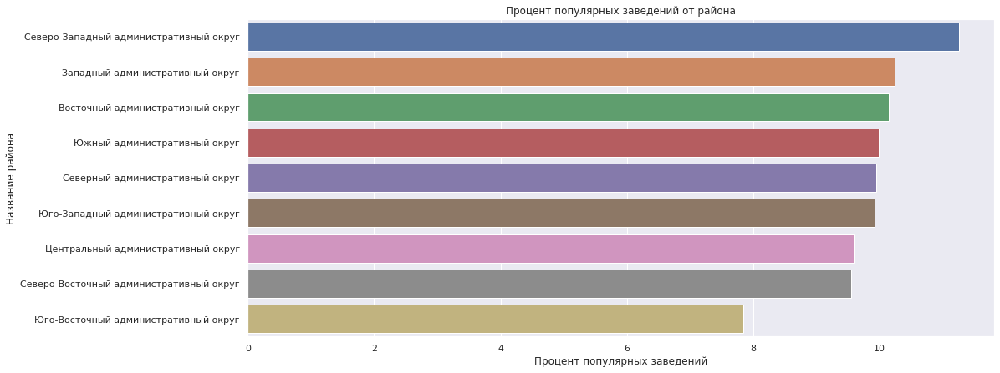

In [37]:
f, ax = plt.subplots(figsize=(16, 7))

ax = sb.barplot(data=district_merge, y="district", x="percent")

ax.set_xlabel('Процент популярных заведений')
ax.set_ylabel('Название района')
ax.set_title('Процент популярных заведений от района')
#plt.xticks(rotation=45)
plt.show()

In [38]:
print('Всего заведений в Топ-15:', top_15['count'].sum())


Всего заведений в Топ-15: 811


**Выводы**

Таким образом, всего популярных заведений в мск 811. Кофейни занимают большую часть рынка. 

В абсолютном выражении Центральный адм округ обладает наибольших числом популярных заведений (215). В основном, эьл кофейни, рестораны и кафе. 

Стоит отметить, что в Северо-Западной округе более 10% составляют популярные сети питания.

In [39]:
# категории заведений по районам
district_chain_data = data.groupby(['district', 'category']).agg({'rating': 'median', 'name': 'count'})
district_chain_data = district_chain_data.sort_values('rating', ascending=False).reset_index()
district_chain_data = district_chain_data.rename(columns={'name': 'count'})
district_chain_data.head()

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.50,364
1,Западный административный округ,"бар,паб",4.45,46
2,Северо-Западный административный округ,"бар,паб",4.40,23
3,Северный административный округ,"бар,паб",4.40,66
4,Центральный административный округ,ресторан,4.40,670


In [40]:
fig = px.bar(district_chain_data,
             x='count',
             y='district',
             color='category'
            )
fig.update_layout(title = 'Количество заведений каждой категории по районам Москвы',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название района',
                  yaxis={'categoryorder': 'total ascending'}
)
fig.show()

In [41]:
print(f'Административные районы Москвы в датасете:', district_chain['district'].unique())


Административные районы Москвы в датасете: ['Центральный административный округ' 'Западный административный округ'
 'Северный административный округ' 'Южный административный округ'
 'Восточный административный округ' 'Юго-Западный административный округ'
 'Северо-Восточный административный округ'
 'Юго-Восточный административный округ'
 'Северо-Западный административный округ']


**Вывод:** 

Всего районов - 9.

В центральном районе больше всего заведений.

Преобладают кафе, кофейни и рестораны.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [42]:
category_rating = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
category_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [43]:
fig = px.bar(category_rating,
             x='rating',
             y='category',
             text='rating',
             color='category'
            )
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

**Выводы**

наивысший рейтинг у баров/пабов.
самые низший рейтинг у мест быстрого питания (4,05).

У всех заведений рейтинг выше 4

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района**

In [44]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_data

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [45]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаем карту Мск
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# вывод карты
m

**Вывод** 

График наглядно показывает, что самый высокий рейтинг заведений в центре.

Самый низкий на Юго-Востоке Москвы.

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# функция, принимающая строку датафрейма, создает маркер в текущей точке и
# добавляет его в кластер marker_cluster

def create_cluster(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
# к каждой строке датафрейма применяем функцию
data.apply(create_cluster, axis=1)

# выводим карту
m

**Выводы**

Преобладающее количество заведений расположено в центре города

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [47]:
streets = data[data['street'].notnull()]
top15_streets = streets['street'].value_counts().reset_index().head(15)
top15_streets.columns = ['street', 'count']
top15_streets

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,дмитровское шоссе,88
5,каширское шоссе,77
6,варшавское шоссе,76
7,ленинградский проспект,72
8,ленинградское шоссе,70
9,мкад,65


In [48]:
# таблица со столбцами - улица - категоория - количество
streets_category = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_category.columns = ['street', 'category', 'count']
streets_category.sort_values('count', ascending=False)

,street,category,count
2136,проспект мира,кафе,53
1519,мкад,кафе,45
2139,проспект мира,ресторан,45
2137,проспект мира,кофейня,36
2148,профсоюзная улица,кафе,35
...,...,...,...
1535,молодёжная улица,кофейня,1
1537,монтажная улица,кофейня,1
1538,монтажная улица,ресторан,1
1539,москворецкая набережная,кофейня,1


In [49]:
streets_top15_category = streets_category[streets_category['street'].isin(top15_streets['street'])]
streets_top15_category

,street,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3173,улица миклухо-маклая,быстрое питание,4
3174,улица миклухо-маклая,кафе,20
3175,улица миклухо-маклая,кофейня,4
3176,улица миклухо-маклая,пиццерия,2


In [50]:
fig = px.bar(streets_top15_category, 
             x='count', 
             y='street',                    
             color='category'
            )

fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

**Вывод:**

Проспект Мира самая популярная улица. Преобладают кафе и рестораны. 

Замыкает рейтинг улица Миклухо-Маклая

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [51]:
streets_with_one_cafe = data['street'].value_counts().reset_index()
streets_with_one_cafe.columns = ['street', 'count_cafe']
streets_with_one_cafe = streets_with_one_cafe[streets_with_one_cafe['count_cafe']==1]
streets_with_one_cafe

,street,count_cafe
990,верхний сусальный переулок,1
991,симферопольский проезд,1
992,улица антонова-овсеенко,1
993,улица маршала соколовского,1
994,братеевский парк,1
...,...,...
1442,1-я линия хорошёвского серебряного бора,1
1443,яковоапостольский переулок,1
1444,конюшковская улица,1
1445,панкратьевский переулок,1


In [52]:
# сделаем разбивку на категории заведений

In [53]:
streets_categories= streets_category[streets_category['street'].isin(streets_with_one_cafe['street'])]
streets_categories = streets_categories.groupby('category')['street'].count().sort_values(ascending=False)
streets_categories

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: street, dtype: int64

**Выводы**

всего улиц с одним заведением 457.

159 улиц имеют только кафе.

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

In [54]:
median_bill = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [55]:
# создаем карту Москвы

moscowmap = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# хороплет
Choropleth(
    geo_data=state_geo,
    data = median_bill,
    columns = ['district', 'middle_avg_bill'],
    key_on = 'feature.name',
    legend_name = 'Средний чек заведений по районам',
).add_to(moscowmap)

moscowmap

**выводы**

самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе.

В целом разница между самым высоким и низким ср чеком составляет 1,5-2 раза

### Общий вывод

В результате исслеования рынка общепита Москвы можно заключить следующее:



- Лидируют кафе с по кол-ву заведений 2364(28.3%), далее идут рестораны - 2031(24.3%). Булочные на последнем месте - 255(3.05%).

- Мест для посадки более всего в ресторанах. Далее идут заведения быстрого питания, т.к они больше всего распространены в Москве. Для кафе и столовых посадочных мест меньше всего.

- Несетевой тип заведения преобладает (61.9%). Но кофейни, пиццерии и булочные чаще являются сетями.

- Самая популярная сеть в Москве - Шоколадница. Н

- Всего заведений в топ-15 - 811. 

- из них больше всего находятся в Центральном админинстративном округе. В основном это кафе, кофейни и рестораны. Меньше всего заведений из топ-15 в Северо-Западном админинстративном округе.

- Количество исследуемых районов - 9.Больше всего заведений располагается в Центральном админинстративном округе. Столовые практически отсутсвуют

- Несмотря на популярность ресторанов, кафе и тд, у категорий бар/паб наивысший рейтинг 4.39. Самый маленький рейтинг у ресторанов быстрого питания. Все заведения имеют рейтинг выше 4.

- Центральный округ имеет наибольший рейтинг по заведениям - 4,38. Самый низкий на Юго- Востоке - 4.1.

- Проспект Мира самая популярная улица. Далее идет Профсоюзная улица. Преобладают кафе и рестораны. 

- 457 улиц имеют только одно заведение. 159 из них кафе

- Самый высокий средний чек в Центральном и Западном округах. Самый маленький в Юго-Восточном административном округе.

##  Детализируем исследование: открытие кофейни

Сколько всего кофеен в датасете? 

В каких районах их больше всего, каковы особенности их расположения?

Есть ли круглосуточные кофейни?

Какие у кофеен рейтинги? Как они распределяются по районам?

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

### Количество кофеен

In [56]:
coffee_data = data[data['category'] == 'кофейня']
print('Количество кофеин:', len(coffee_data))

Количество кофеин: 1401


In [57]:
# создаем карту
coffeemap = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаем пустой кластер и добавляем его на карту
marker_cluster = MarkerCluster().add_to(coffeemap)

# функция, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_data.apply(create_clusters, axis=1)

# выводим карту
coffeemap

**Выводы**

Всего 1401 кофеен. Большая часть в Центральном районе. Меньше всего заведений - на Востоке и Юге города.

### Круглосуточные кофейни

In [58]:
coffee_24_7 = coffee_data[coffee_data['is_24/7'] == True]
print('Количество круглосуточных кофеен:', len(coffee_24_7))

Количество круглосуточных кофеен: 59


In [59]:
# создаём карту Москвы
mcoffee_24_7 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(mcoffee_24_7)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
mcoffee_24_7

**Выводы**
В Москве 59 круглосут кофеен. Большинство находится в центре города.  В других районах это не распространено.

### Рейтинг кофеен

In [60]:
coffee_rating = coffee_data.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [61]:
# создаём карту
mcoffee_rating = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    legend_name='Средний рейтинг заведений по районам',
).add_to(mcoffee_rating)

# выводим карту
mcoffee_rating

Самый высокий рейтинг в округах: Центральный административный округ и Северо-Западный административный округ. Самый низкий рейтинг у Западного административного округа.

### Стоимость капучино

В начале работы упомянул, что не стал заменять пропуски в данных о кофе. сейчас попробую посмотреть, как замена пропусков повляет на результаты.

#### Стоимость капучино без замены


In [62]:
cup_of_coffee = coffee_data.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee)
coffee_price = round(cup_of_coffee['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price)

,district,middle_coffee_cup
1,Западный административный округ,188.56
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,166.34
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.23


In [63]:
capuc_map0 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя цена чашки кофе по районам',
).add_to(capuc_map0)

# выводим карту
capuc_map0

Далее я посмотрю, как повлияет замена пропусков на цену кофею Сохраню эксперементальный датасет в переменную data1

In [64]:
# аналогично делаю с кофе
new_avg_bill_coffee = data.groupby('avg_bill')['middle_coffee_cup'].max().dropna()
new_avg_bill_coffee.head()

avg_bill
Цена чашки капучино:100 ₽        100.0
Цена чашки капучино:100–120 ₽    110.0
Цена чашки капучино:100–140 ₽    120.0
Цена чашки капучино:100–150 ₽    125.0
Цена чашки капучино:100–160 ₽    130.0
Name: middle_coffee_cup, dtype: float64

In [65]:
data1 = data.copy()

In [66]:
data1.loc[data1['middle_coffee_cup'].isna(), 'middle_coffee_cup'] = data1['avg_bill'].apply(func_avg)


In [67]:
coffee_data1 = data1[data1['category'] == 'кофейня']


In [68]:
cup_of_coffee1 = coffee_data1.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(cup_of_coffee1)
coffee_price1 = round(cup_of_coffee1['middle_coffee_cup'].mean(), 2)
print(f'Средняя стоимость чашки кофе в Москве:', coffee_price1)

,district,middle_coffee_cup
5,Центральный административный округ,396.49
1,Западный административный округ,326.53
8,Южный административный округ,260.67
4,Северо-Западный административный округ,260.09
2,Северный административный округ,234.03
7,Юго-Западный административный округ,232.49
3,Северо-Восточный административный округ,229.75
0,Восточный административный округ,229.10
6,Юго-Восточный административный округ,176.52


Средняя стоимость чашки кофе в Москве: 260.63


In [69]:
capuc_map1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_of_coffee1,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    legend_name='Средняя цена чашки кофе по районам',
).add_to(capuc_map1)

# выводим карту
capuc_map1

In [70]:
print('Замена пропусков повысит среднюю цену кофе на {0:.1%}'.format(coffee_price1/coffee_price-1))

Замена пропусков повысит среднюю цену кофе на 52.2%


**Вывод**

Таким образом, замена пропусков сильно исказит данные, поэтому не стоит этого делать
260 рублей средняя цена за кофе - это дорого.

По изначальным данным - Самый дорогой кофе в Западном(188.56) и Центральном округах(187.52). Средняя стоимость чашки кофе для Москвы - 171.23.

**Рекомендации**

Перспективными для открытия кофейни являются Центральный, Западный и Юго-Западный, т.к. в этих районах высокая стоимость чашки кофе.

Высокая рыночная цена позволит использовать на старте стратегию низких цен, чтобы привлечь потребителей.

При решении открыть круглосуточную кофейню, то стоит открываться в центре, так это наиболее оживленный район, и кофеен не так много. 

Если ориентироваться на стратегию повышения качества продукта, то в Западном округе наименьший рейтинг у кофеен. Компания может завоевать посетителей с помощью качества продукта и сервиса.

Также из исследования было отмечено, что кофейни - это в большей части сетевой бизнес. МОжно попробовать открыть заведение по франшизе. ТАк, наиболее популярные кофейни центра можно продвигать и в другие районы города.





Презентация: https://disk.yandex.ru/d/vyJF_9AIqGViyg